# TYPES MATCHING NOTEBOOK

##### This notebook requires the notebook "4-Chip+Cell Typing" from the standard analysis pipeline to have been run before to work.

The present notebook will help you match the clusters obtained with the cell typing and the reported type they can (hopefully) be assimilated to. An equivalent calcium trace of the clusters' PSTH in response to a chirp will be compared to those of 32 different cell types reported in litterature. It is up to the user to base their decision only on this matching, however it is recommanded to add other external elements like orientation or direction selectivity, previous sortings, reference databases, colleagues' advise... to obtain the most trustful results.



In [1]:
import os
from tqdm.auto import tqdm
import numpy as np
import matplotlib.pyplot as plt
import params
from utils import *
from matplotlib.gridspec import GridSpec
import math
from scipy.io import loadmat
from scipy import interpolate

# For clustering
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
import scipy as sc
from sklearn.decomposition import SparsePCA




def calcium_exp(x):
    a =           0
    b =       1.086 
    c =       1.747 -1.0              ##################### changes here
    val = a+b*np.exp(-c*x)
    return val

def toCalciumLinear(time_sequence, spike_train):
    calcium_filter = calcium_exp(time_sequence);
    
    stitch3 = np.append(spike_train,[spike_train,spike_train])
    
    calcium_trace = np.convolve(stitch3, calcium_filter, 'full')[len(spike_train):len(spike_train)*2];
    calcium_trace = calcium_trace-min(calcium_trace)
    calcium_trace=calcium_trace/max(calcium_trace)
    return calcium_trace

## Loading the different parameters

In [2]:
exp=params.exp
recording_names=params.recording_names
output_directory=params.output_directory

print(*['{} : {}'.format(i,recording_name) for i, recording_name in enumerate(recording_names)], sep="\n")
recording_number = int(input("\nSelect chirp recording : "))
rec = recording_names[recording_number]
print(f"\nSelected recording : {rec} \n")

cell_typing_directory = os.path.join(output_directory, 'CellTyping_Analysis_rec_{}'.format(recording_number))
data_path=os.path.join(cell_typing_directory,'{}_cell_typing_data'.format(exp))
cell_data=load_obj(data_path)

selected_cells=load_obj(os.path.join(cell_typing_directory,'{}_selected_cells_for_clustering'.format(exp)))['selected_cells']

0 : 20240920-meas00-acclim-check-30Hz-20px30ch
1 : 20240920-meas01-check-30Hz-12px50ch
2 : 20240920-meas02-chirp-50Hz
3 : 20240920-meas03-DG_50hZ_8dir_2sT_274pixL_864x864
4 : 20240920-meas04-saccades_equistims_1000Hz_1bit



Select chirp recording :  2



Selected recording : 20240920-meas02-chirp-50Hz 



In [93]:
labels=np.empty(len(selected_cells)).astype(int)


for i in range(len(selected_cells)):
    icell=selected_cells[i]
    labels[i]=cell_data[icell]['type']
    
    
n_cells = len(selected_cells)
#-----------------------------------
#-----------------------------------
# Get Euler PCA
n_rep = 20 # nb of repeats
nt = 32 # total length
dt = 0.04 # bin size in seconds
time_bins = np.arange(0,nt+dt,dt)

spikes = np.zeros((n_cells, int(nt/dt), n_rep))
for cell_index in range(len(selected_cells)):
    cell_id = selected_cells[cell_index]
    spike_cell = cell_data[cell_id]["spike_trains"]
    for rep in range(n_rep):
        temp=np.histogram(spike_cell[rep], bins=time_bins)
        spikes[cell_index,:,rep] = temp[0]

#-------------------------
# Pre process the PSTH
psth = np.mean(spikes, 2)
psth_z = sc.stats.zscore(psth, 1)    

exp_labels = np.sort(np.unique(labels))
psth_z.shape, 'Ncells  - Ndatapoints'

((216, 800), 'Ncells  - Ndatapoints')

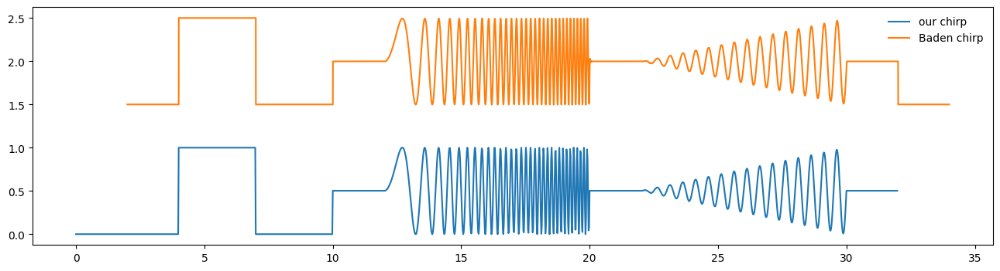

In [80]:
types_matching_folder= './ressources'
baden=loadmat(os.path.join( types_matching_folder,'baden_data.mat'))
calcium=loadmat(os.path.join( types_matching_folder,'calcium_conversion.mat'))
vec_name = 'Euler_50Hz_20reps_1024x768pix.vec'

#the normalized profile of the chirp stimulus used in Baden et al.  #31988 points
chirp_stim=baden['chirp_stim'][:,0]/max(baden['chirp_stim'][:,0])

#the triggers used in Baden et al. plus two seconds (to match them with our stimulus)  #31988 points
chirp_stim_time = baden['chirp_stim_time'][0,:] +2

# a 249 points array from 0 to 32 seconds. Times of calcium sampling at 8Hz?
baden_time_original = baden['chirp_time'][0,:]

# a (11210, 1) array. I suppose 11210 were the measurements taken and in this array are the labels of the groups
# in which each measurment was clustered
group_idx = baden['group_idx'] 

# the average calcium traces for each measurement. Each measurement has 249 time points.
psth_euler = baden['chirp_avg']

#here I load from a csv the labels of the Baden types
euler_labels_f = open(os.path.join( types_matching_folder, 'Baden Types'))
euler_labels_f = csv.reader(euler_labels_f,delimiter=",");
euler_labels={}    #this contains the 32 labels of the euler cell types
c=0
for row in euler_labels_f:
    if c==0:
        stim_cond_head = row
        c=1
    else:
        euler_labels[c-1]= row
        c+=1
#------------------- 

n_baden_types = len(euler_labels)

#our stimulus. Load it and normalize it
vec_path=os.path.join( types_matching_folder,vec_name)
euler_vec = np.genfromtxt(vec_path)
euler_vec = euler_vec[151:151+1600,1]/max(euler_vec[151:151+1600,1])

#### Repeat this check for the older chirp version!!!!!!

nb_chirp_bins=cell_data[list(cell_data.keys())[0]]["psth"].size

plt.figure(figsize = (16,4))
time_stim = np.linspace(0,32,1600+1)[:-1]
time = np.linspace(0,32,nb_chirp_bins+1)[:-1]
# Our chirp
plt.plot(time_stim, euler_vec, label='our chirp')
euler_vec.shape
euler_vec[::5].shape,time.shape
# Baden chirp
plt.plot(chirp_stim_time ,chirp_stim+1.5, label = 'Baden chirp')
chirp_stim_time.shape, chirp_stim.shape
plt.legend(frameon=False)

# Comparison range:
comp_range = [0.1,31.9]         # to avoid prestep effects ### why 0.1 and not 2 ?
delta_range = comp_range[1]-comp_range[0]
time_common = np.linspace(comp_range[0],comp_range[1],int(delta_range/0.05) +2)


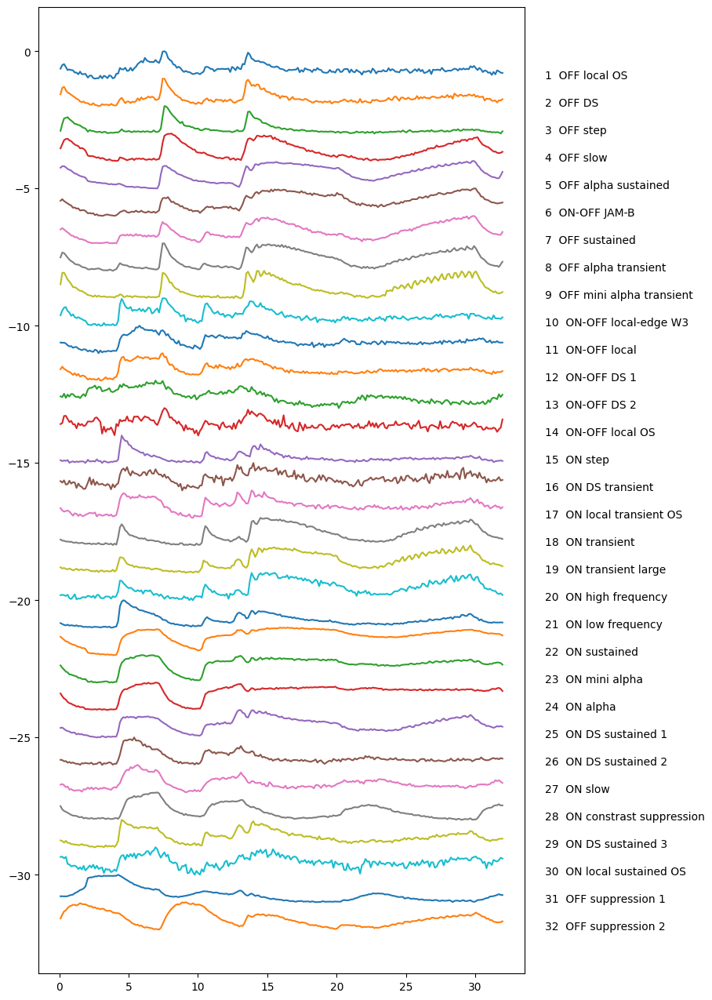

In [94]:
# the two additional seconds at the end of Baden stim that will be stitched in the beginning
baden_time = baden_time_original+2
baden_first = baden_time[-15:]-32 
baden_time = np.append(baden_first,baden_time[:-15])

#we do the same for the calcium traces
Baden_types = []

plt.figure(figsize=(8,16))

for i in np.arange(n_baden_types)+1:
    #here the calcium traces of all the recordings of each type are averaged together
    trace = np.mean(psth_euler[:,(group_idx==i)[:,0]],1)  
    #and here they are all put between 0 and 1
    trace = trace-min(trace)
    trace = trace/max(trace)
    trace = np.append(trace[-15:],trace[:-15])                # I stitch the last 2 s in the beggining so that it is 
                                                              #  the same as my experimental stim
    Baden_types.append(trace)
    plt.plot(baden_time,trace-i)
    plt.text(35,-i,str(i)+'  '+euler_labels[i-1][0])

## Generation of equivalent calcium traces

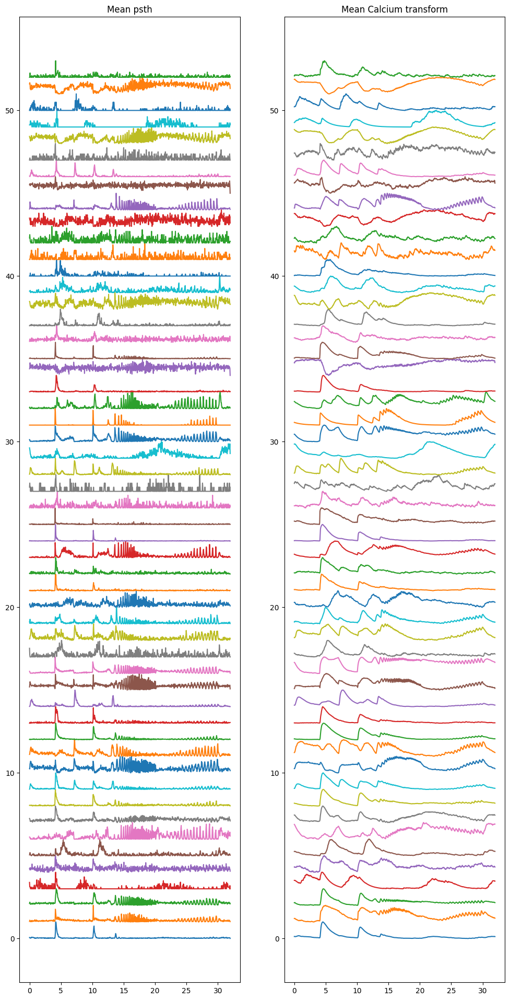

In [95]:
Exp_types = []
fig = plt.figure(figsize=(12,24))
fig.add_subplot(1,2,1)
for i in exp_labels:
    #I repeat to my spiking data the treatment I did for the Euler's calcium traces
    trace = np.mean(psth_z[(labels==i),:],0)
    trace = trace-min(trace)
    trace = trace/max(trace)
    Exp_types.append(trace)
    plt.plot(time,trace+i)
    plt.title('Mean psth')

# Experiment to calcium
Exp_types_Ca = {}
fig.add_subplot(1,2,2)
for i in exp_labels:
    # I transform each cluster's mean psth into a calcium trace
    trace = toCalciumLinear(time,Exp_types[i])
    Exp_types_Ca[i] = trace    #the only difference is that my made-up calcium traces have the dimension of the 
                                #number of bins the PSTHs had while the baden traces have dimension 249
    plt.plot(time,trace+i)
    plt.title('Mean Calcium transform')

## Comparison of the equivalent traces with the reference ones 

In [7]:
# Interpolate both calcium traces (Baden and transformed traces) and then calculate them on the same set of times
Baden_common = {}
for i in np.arange(n_baden_types):
    f = interpolate.interp1d(baden_time, Baden_types[i])
    Baden_common[i] = f(time_common)   # use interpolation function returned by `interp1d`

Exp_common={}
for i in exp_labels:
    f = interpolate.interp1d(time, Exp_types_Ca[i])
    Exp_common[i] = f(time_common)   # use interpolation function returned by `interp1d`

#n_matches = 29
corr_table = np.zeros([len(exp_labels),n_baden_types]) 
corr_match = np.zeros([len(exp_labels),n_baden_types])
corr_match_vals = np.zeros([len(exp_labels),n_baden_types])
delta_match = np.zeros([len(exp_labels),n_baden_types+1])

# For each of our generated calcium type we compute the corr coef with each Baden type
for i in exp_labels:
    for j in np.arange(n_baden_types):
        corr_table[i,j] = np.corrcoef(Exp_common[i], Baden_common[j])[0,1]
    # For each calcium type, sort de corr coefs in descending order (max first)
    corr_match[i,:] = np.flip(np.argsort(corr_table[i,:])[-32:]) # sorted indices
    corr_match_vals[i,:] = corr_table[i,:][np.flip([np.argsort(corr_table[i,:])[-32:]])] # sorted corr coef values
    # Select the 10 larger corr coefs and store the difference with the next one
    for j in np.arange(10):
        #each row is one of our clusters and each column is the corr.coeff of that cluster with a Baden one. Decreasing order
        delta_match[i,j] = corr_match_vals[i,j]-corr_match_vals[i,j+1] 

In [13]:


group_save_path = os.path.join(cell_typing_directory,r'group_selection.npy')

if r'group_selection.npy' in os.listdir(cell_typing_directory):
    group_selection=np.load(group_save_path,allow_pickle=True)
else : 
    group_selection = [ [] for i in range(len(exp_labels))]

print(group_selection)

[list([14]) list([16]) list([14]) list([]) list([9]) list(['custom_01'])
 list(['custom_02']) list([20]) list([25]) list([9]) list([5])
 list(['custom_03']) list([20]) list([14]) list([0]) list([5]) list([22])
 list(['custom_01']) list([9]) list(['custom_04']) list([]) list([14])
 list([20]) list([27]) list([14]) list([20]) list([]) list([])
 list(['custom_05']) list(['custom_06']) list([16]) list([17])
 list(['custom_02']) list([14]) list([]) list([20]) list([25])
 list(['custom_01']) list(['custom_02']) list([27]) list([25]) list([])
 list([]) list([]) list(['custom_04']) list([]) list([11]) list([])
 list(['custom_07']) list([]) list([]) list(['custom_07']) list([])]


In [80]:
corr_match_vals[8,np.where(corr_match==25)[0][0]]

0.8151378864480449

### Preselection

Run this cell until you are satisfied with your preselection of possible type(s) for each cluster.

0 : [14]  ,  1 : [16]  ,  2 : [14]  ,  3 : []  ,  4 : [9]  ,  5 : ['custom_01']  ,  6 : ['custom_02']  ,  7 : [20]  ,  8 : [25]  ,  9 : [9]  ,  10 : [5]  ,  11 : ['custom_03']  ,  12 : [20]  ,  13 : [14]  ,  14 : [0]  ,  15 : [5]  ,  16 : [22]  ,  17 : ['custom_01']  ,  18 : [9]  ,  19 : ['custom_04']  ,  20 : []  ,  21 : [14]  ,  22 : [20]  ,  23 : [27]  ,  24 : [14]  ,  25 : [20]  ,  26 : []  ,  27 : []  ,  28 : ['custom_05']  ,  29 : ['custom_06']  ,  30 : [16]  ,  31 : [17]  ,  32 : ['custom_02']  ,  33 : [14]  ,  34 : []  ,  35 : [20]  ,  36 : [25]  ,  37 : ['custom_01']  ,  38 : ['custom_02']  ,  39 : [27]  ,  40 : [25]  ,  41 : []  ,  42 : []  ,  43 : []  ,  44 : ['custom_04']  ,  45 : []  ,  46 : [11]  ,  47 : []  ,  48 : []  ,  49 : []  ,  50 : []  ,  51 : []  ,  52 : []



Select cluster number :  48


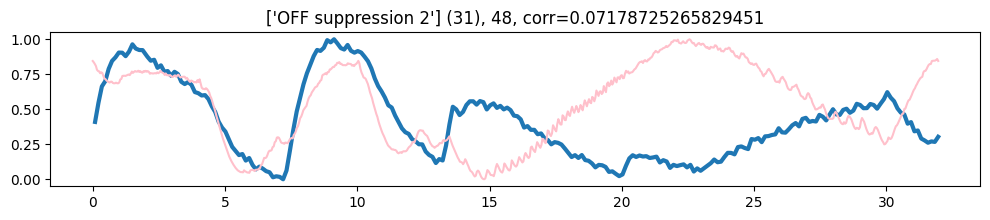

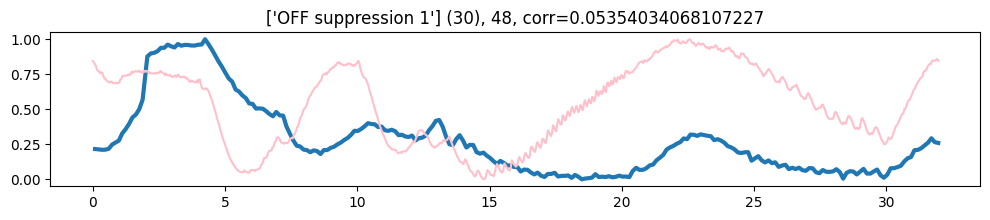

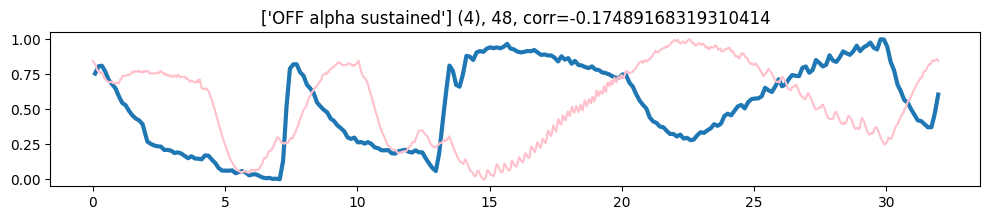

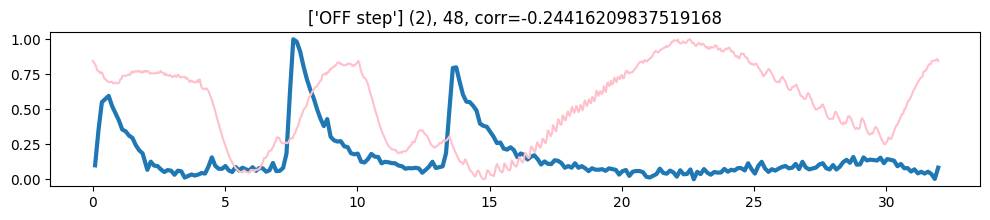

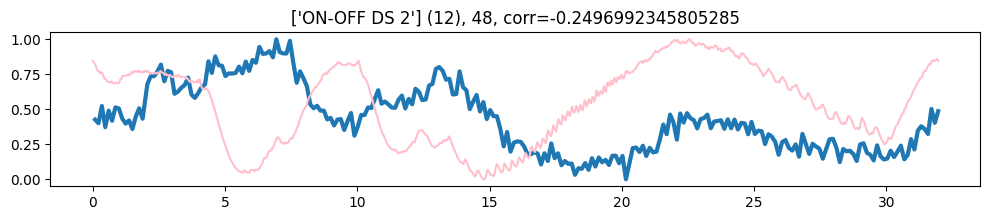

What type(s) does this cell belongs to ? (put the number)



KeyboardInterrupt: Interrupted by user

In [162]:
matches_to_plot = 5

colors = ['orange','r','g','pink','y','gray','k','c','m','darkgray','coral','gold','plum','wheat','navy']
#             0     1   2    3     4    5     6   7   8      9         10      11     12      13     14

output_traces={}
output_traces['Baden time']=baden_time
output_traces['Exp time']=time
output_traces['Groups']={}

euler_labels_string = [str(i) for i in euler_labels.keys()]

print(*['{} : {}'.format(i,group_selection[i]) for i in exp_labels], sep="  ,  ")
cluster_number = int(input("\nSelect cluster number : "))

my_clusters=[cluster_number]

for my_clus_i in range(len(my_clusters)):
    
    
    my_clus=my_clusters[my_clus_i]
    
    for baden_cluster_i in range(len(corr_match[my_clus,:matches_to_plot])) :
                                 
        baden_cluster=int(corr_match[my_clus,:10][baden_cluster_i])
        
        output_traces['Groups'][my_clus]={}

        i=np.where(corr_match[my_clus,:]==baden_cluster)[0][0]
        plt.figure(figsize=(12,2))
        plt.plot(baden_time, Baden_types[baden_cluster],lw=3)
        plt.title('{} ({}), {}, corr={}'.format(euler_labels[baden_cluster],baden_cluster, my_clus,corr_match_vals[my_clus,baden_cluster_i]))

        plt.plot(time, Exp_types_Ca[my_clus],color=colors[my_clus%15])
        plt.show()

        output_traces['Groups'][my_clus]['Type']=euler_labels[baden_cluster][0]
        output_traces['Groups'][my_clus]['Baden Ca trace']=Baden_types[baden_cluster]
        output_traces['Groups'][my_clus]['Exp Ca trace']=Exp_types_Ca[my_clus]


print('What type(s) does this cell belongs to ? (put the number)\n')
to_add = input("\nSelect one type : ")
if to_add in euler_labels_string :
    print(f'{to_add} is a valid type number :)')
    group_selection[cluster_number].append(int(to_add))
else : 
    print(f'{to_add} is not a valid type number :(')
confirmation = False
while not confirmation : 
    if not (input('Continue ? y/[n]')=='y') :
        confirmation=True
    else :
        to_add = input("Select one type : ")
        if to_add in euler_labels_string :
            print(f'{to_add} is a valid type number :)')
            group_selection[cluster_number].append(int(to_add))
        else : 
            print(f'{to_add} is not a valid type number :(')

group_selection[cluster_number]=sorted(list(set(group_selection[cluster_number])))
print(f"\nSelected type(s) for cluster {cluster_number} : {group_selection[cluster_number]} \n")

np.save(group_save_path,np.asanyarray(group_selection,dtype='object'))


### Removal

Remove some types that you don't feel match some clusters. Basically a cell to run if you did a mistake and wrongly associate a type with a cluster which actually doesn't match with any type according to you. If you just put one type among others that match better, then don't bother going through this cell for this cluster, since the following one will ask you to select the better march anyway.

Technically speaking this cell can also allow you to select the better match by elimination, but it can be longer.

In [165]:

print(*['{} : {}'.format(i,group_selection[i]) for i in exp_labels], sep="  ,  ")
cluster_number = int(input("\nSelect cluster number : "))

my_clusters=[cluster_number] 

for my_clus_i in range(len(my_clusters)):
    
    
    my_clus=my_clusters[my_clus_i]
    if len(group_selection[my_clus])>0 and group_selection[my_clus][0] in euler_labels.keys() :
        for baden_cluster in group_selection[cluster_number] :
                                     
            #baden_cluster=int(corr_match[my_clus,:10][baden_cluster_i])
            
            output_traces['Groups'][my_clus]={}
    
            i=np.where(corr_match[my_clus,:]==baden_cluster)[0][0]
            plt.figure(figsize=(12,2))
            plt.plot(baden_time, Baden_types[baden_cluster],lw=3)
            plt.title('{} ({}), {}, corr={}'.format(euler_labels[baden_cluster],baden_cluster, my_clus,corr_match_vals[my_clus,np.where(corr_match[my_clus]==baden_cluster)[0][0]]))
    
            plt.plot(time, Exp_types_Ca[my_clus],color=colors[my_clus%15])
            plt.show()
    
            output_traces['Groups'][my_clus]['Type']=euler_labels[baden_cluster][0]
            output_traces['Groups'][my_clus]['Baden Ca trace']=Baden_types[baden_cluster]
            output_traces['Groups'][my_clus]['Exp Ca trace']=Exp_types_Ca[my_clus]

group_label_string = [str(i) for i in group_selection[cluster_number]]
print('Do you want to remove some type from this selection ?\n')
to_add = input("\nSelect one type to remove : ")
if to_add in group_label_string :
    print(f'{to_add} is a valid type number in the preselection :)')
    if 'custom_' in to_add :
        group_selection[cluster_number].remove(to_add)
    else :
        group_selection[cluster_number].remove(int(to_add))
    group_label_string = [str(i) for i in group_selection[cluster_number]]
else : 
    print(f'{to_add} is not a valid type number in the preselection :(')
confirmation = False
while not confirmation : 
    if not (input('Continue ? y/[n]')=='y') :
        confirmation=True
    else :
        to_add = input("Select one type to remove : ")
        if to_add in group_label_string :
            print(f'{to_add} is a valid type number in the preselection :)')
            if 'custom_' in to_add : 
                group_selection[cluster_number].remove(to_add)
            else :
                group_selection[cluster_number].remove(int(to_add))
            group_label_string = [str(i) for i in group_selection[cluster_number]]
        else : 
            print(f'{to_add} is not a valid type number in the preselection :(')

group_selection[cluster_number]=sorted(list(set(group_selection[cluster_number])))
print(f"\nRemaining type(s) for cluster {cluster_number} : {group_selection[cluster_number]} \n")

np.save(group_save_path,np.asanyarray(group_selection,dtype='object'))

0 : [14]  ,  1 : [16]  ,  2 : [14]  ,  3 : []  ,  4 : [9]  ,  5 : ['custom_01']  ,  6 : ['custom_02']  ,  7 : [20]  ,  8 : [25]  ,  9 : [9]  ,  10 : [5]  ,  11 : ['custom_03']  ,  12 : [20]  ,  13 : [14]  ,  14 : [0]  ,  15 : [5]  ,  16 : [22]  ,  17 : ['custom_01']  ,  18 : [9]  ,  19 : ['custom_04']  ,  20 : []  ,  21 : [14]  ,  22 : [20]  ,  23 : [27]  ,  24 : [14]  ,  25 : [20]  ,  26 : []  ,  27 : []  ,  28 : ['custom_05']  ,  29 : ['custom_06']  ,  30 : [16]  ,  31 : [17]  ,  32 : ['custom_02']  ,  33 : [14]  ,  34 : []  ,  35 : [20]  ,  36 : [25]  ,  37 : ['custom_01']  ,  38 : ['custom_02']  ,  39 : [27]  ,  40 : [25]  ,  41 : []  ,  42 : []  ,  43 : []  ,  44 : ['custom_04']  ,  45 : []  ,  46 : [11]  ,  47 : []  ,  48 : []  ,  49 : []  ,  50 : []  ,  51 : []  ,  52 : []



Select cluster number :  51


Do you want to remove some type from this selection ?




Select one type to remove :  dfg


dfg is not a valid type number in the preselection :(


Continue ? y/[n] n



Remaining type(s) for cluster 51 : [] 



### Selection

Run this to select THE type each cluster belongs to amongst the ones in its preselection. The outcome of this cell will overwrite the preselection, so be careful. If in doubt, you can still navigate between this cell and the previous one. 

You are encouraged to use external data to take your decisions. Don't hesitate to refer to the different outcomes of the standard analysis pipeline. For example, verify that a cell is orientation selective before attributing an "OS-" type to it. 

Run this cell until you have selected at most one type for each cluster.

0 : [14]  ,  1 : [16]  ,  2 : [14]  ,  3 : []  ,  4 : [9]  ,  5 : ['custom_01']  ,  6 : ['custom_02']  ,  7 : [20]  ,  8 : [25]  ,  9 : [9]  ,  10 : [5]  ,  11 : ['custom_03']  ,  12 : [20]  ,  13 : [14]  ,  14 : [0]  ,  15 : [5]  ,  16 : [22]  ,  17 : ['custom_01']  ,  18 : [9]  ,  19 : ['custom_04']  ,  20 : []  ,  21 : [14]  ,  22 : [20]  ,  23 : [27]  ,  24 : [14]  ,  25 : [20]  ,  26 : []  ,  27 : []  ,  28 : ['custom_05']  ,  29 : ['custom_06']  ,  30 : [16]  ,  31 : [17]  ,  32 : ['custom_02']  ,  33 : [14]  ,  34 : []  ,  35 : [20]  ,  36 : [25]  ,  37 : ['custom_01']  ,  38 : ['custom_02']  ,  39 : [27]  ,  40 : [25]  ,  41 : []  ,  42 : []  ,  43 : []  ,  44 : ['custom_04']  ,  45 : []  ,  46 : [9, 11, 13]  ,  47 : []  ,  48 : []  ,  49 : []  ,  50 : []  ,  51 : []  ,  52 : []



Select cluster number :  46


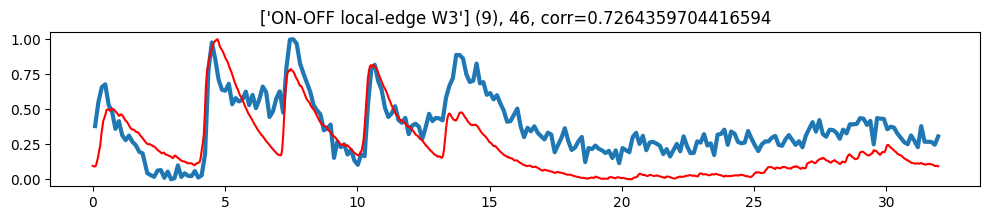

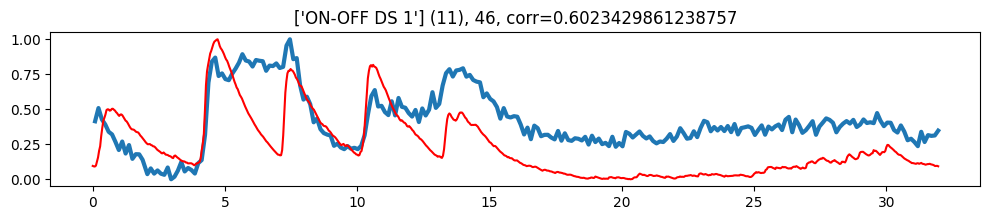

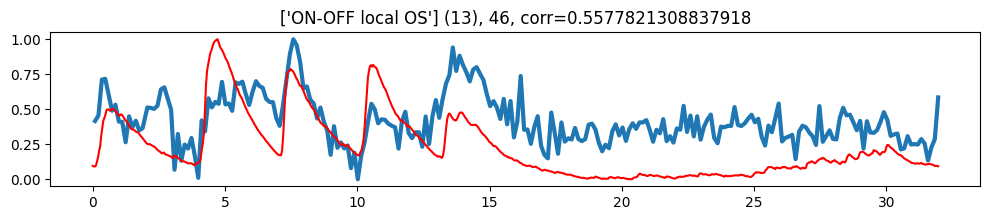

What unique type does this cell belongs to, if any ? (put the number)




Select one type :  11


11 is a valid type number in the preselection :)


Continue ? y/[n] n



Selected type for cluster 46 : [11] 



In [161]:

print(*['{} : {}'.format(i,group_selection[i]) for i in exp_labels], sep="  ,  ")
cluster_number = int(input("\nSelect cluster number : "))

my_clusters=[cluster_number] 

for my_clus_i in range(len(my_clusters)):
    
    
    my_clus=my_clusters[my_clus_i]
    if len(group_selection[my_clus])>0 and group_selection[my_clus][0] in euler_labels.keys()  :
        
        for baden_cluster in group_selection[cluster_number] :
                                     
            #baden_cluster=int(corr_match[my_clus,:10][baden_cluster_i])
            
            output_traces['Groups'][my_clus]={}
    
            i=np.where(corr_match[my_clus,:]==baden_cluster)[0][0]
            plt.figure(figsize=(12,2))
            plt.plot(baden_time, Baden_types[baden_cluster],lw=3)
            plt.title('{} ({}), {}, corr={}'.format(euler_labels[baden_cluster],baden_cluster, my_clus,corr_match_vals[my_clus,np.where(corr_match[my_clus]==baden_cluster)[0][0]]))
    
            plt.plot(time, Exp_types_Ca[my_clus],color=colors[my_clus%15])
            plt.show()
    
            output_traces['Groups'][my_clus]['Type']=euler_labels[baden_cluster][0]
            output_traces['Groups'][my_clus]['Baden Ca trace']=Baden_types[baden_cluster]
            output_traces['Groups'][my_clus]['Exp Ca trace']=Exp_types_Ca[my_clus]

group_label_string = [str(i) for i in group_selection[cluster_number]]
print('What unique type does this cell belongs to, if any ? (put the number)\n')
to_add = input("\nSelect one type : ")
if to_add in group_label_string :
    print(f'{to_add} is a valid type number in the preselection :)')
    group_selection[cluster_number]=[int(to_add)]
else : 
    print(f'{to_add} is not a valid type number in the preselection :(')
confirmation = False
while not confirmation : 
    if not (input('Continue ? y/[n]')=='y') :
        confirmation=True
    else :
        to_add = input("Select one type : ")
        if to_add in euler_labels_string :
            print(f'{to_add} is a valid type number in the preselection :)')
            group_selection[cluster_number]=[int(to_add)]
        else : 
            print(f'{to_add} is not a valid type number in the preselection :(')

group_selection[cluster_number]=sorted(list(set(group_selection[cluster_number])))
print(f"\nSelected type for cluster {cluster_number} : {group_selection[cluster_number]} \n")

np.save(group_save_path,np.asanyarray(group_selection,dtype='object'))

### Custom typing

#### Run this cell only if you can definitely not match some significant clusters with any type. If you have clusters composed only of 1 noisy cell just leave it empty.

This cell will allow you to put a custom label to a cluster. This label needs to start with "custom_" (i.e : "custom_01"). The types selection of a cluster needs to be empty to receive custom labelling. If it is not but you want to attribute a custom label to it, then first remove the existing type number(s) by running the "Removal" cell above.  

In [168]:
print(*['{} : {}'.format(i,group_selection[i]) for i in exp_labels], sep="  ,  ")
cluster_number = int(input("\nSelect cluster number : "))

my_clusters=[cluster_number] 

group_label_string = [str(i) for i in group_selection[cluster_number]]
print('What custom type does this cell belongs to, if any ? (put "custom_#")\n')
to_add = input("\nName this custom type : ")
if 'custom_' in to_add and len(group_label_string)==0 :
    print(f'{to_add} is a valid name and the selection is empty :)')
    group_selection[cluster_number]=[to_add]
else : 
    print(f'{to_add} is not a valid name and/or the selection is not empty :(')
confirmation = False
while not confirmation : 
    if not (input('Continue ? y/[n]')=='y') :
        confirmation=True
    else :
        to_add = input("\nName this custom type : ")
        if 'custom_' in to_add and len(group_label_string)==0 :
            print(f'{to_add} is a valid name and the selection is empty :)')
            group_selection[cluster_number]=[to_add]
        else : 
            print(f'{to_add} is not a valid name and/or the selection is not empty :(')

group_selection[cluster_number]=sorted(list(set(group_selection[cluster_number])))
print(f"\nSelected type for cluster {cluster_number} : {group_selection[cluster_number]} \n")

np.save(group_save_path,np.asanyarray(group_selection,dtype='object'))

0 : [14]  ,  1 : [16]  ,  2 : [14]  ,  3 : []  ,  4 : [9]  ,  5 : ['custom_01']  ,  6 : ['custom_02']  ,  7 : [20]  ,  8 : [25]  ,  9 : [9]  ,  10 : [5]  ,  11 : ['custom_03']  ,  12 : [20]  ,  13 : [14]  ,  14 : [0]  ,  15 : [5]  ,  16 : [22]  ,  17 : ['custom_01']  ,  18 : [9]  ,  19 : ['custom_04']  ,  20 : []  ,  21 : [14]  ,  22 : [20]  ,  23 : [27]  ,  24 : [14]  ,  25 : [20]  ,  26 : []  ,  27 : []  ,  28 : ['custom_05']  ,  29 : ['custom_06']  ,  30 : [16]  ,  31 : [17]  ,  32 : ['custom_02']  ,  33 : [14]  ,  34 : []  ,  35 : [20]  ,  36 : [25]  ,  37 : ['custom_01']  ,  38 : ['custom_02']  ,  39 : [27]  ,  40 : [25]  ,  41 : []  ,  42 : []  ,  43 : []  ,  44 : ['custom_04']  ,  45 : []  ,  46 : [11]  ,  47 : []  ,  48 : ['custom_07']  ,  49 : []  ,  50 : []  ,  51 : []  ,  52 : []



Select cluster number :  51


What custom type does this cell belongs to, if any ? (put "custom_#")




Name this custom type :  custom_07


custom_07 is a valid name and the selection is empty :)


Continue ? y/[n] n



Selected type for cluster 51 : ['custom_07'] 



# /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\

### Attribution

#### /!\ Run this cell if you are 100% satisfied with the selection obtained at the previous cell /!\\\ 

If a cluster has several type assigned, the first in the numeric order will be attributed. If it has none, then it will be attributed "Not assigned".

# /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\ /!\

In [83]:

for cell_id in tqdm(cell_data.keys()) :
    cell_data[cell_id]['baden_type']={}
    if cell_id in selected_cells : 
        group_id = group_selection[cell_data[cell_id]['type']]
        if len(group_id)>0:
            if group_id[0] in euler_labels.keys() :
                cell_data[cell_id]['baden_type']= {'id' : group_id[0], 'name' : euler_labels[group_id[0]][0] }
            else : cell_data[cell_id]['baden_type']= {'id' : group_id[0], 'name' : group_id[0] }
        else : 
            cell_data[cell_id]['baden_type']= {'id' : None, 'name' : 'Not assigned' }
    else : 
        cell_data[cell_id]['baden_type']= {'id' : None, 'name' : 'Not assigned' }



  0%|          | 0/340 [00:00<?, ?it/s]

# Save

#### Be careful ! This will add data to the already-existing dictionnary containing the output of the chirp and cell typing notebook !

In [85]:
save_obj(cell_data, data_path)

# Plot the selection

### Load and re-load data

In [86]:
cell_data = load_obj(data_path)

sta_results = load_obj(os.path.join(find_Analysis_Directory(dir_type="Checkerboard"),f'sta_data_3D_fitted'))
DG_set = load_obj(os.path.join(find_Analysis_Directory(dir_type="DG"),f'DG_data_exp{exp}'))
fig_directory = os.path.normpath(os.path.join(cell_typing_directory,r'Baden_typing'))
if not os.path.isdir(fig_directory): os.makedirs(fig_directory)

old = False

if old:
    vec_path = os.path.join('./ressources', r"EulerStim180530.vec")
    euler_vec = -np.genfromtxt(vec_path)  
else:    
    vec_path = os.path.join('./ressources', r"Euler_50Hz_20reps_1024x768pix.vec")
    euler_vec = np.genfromtxt(vec_path)



 Several DG analysis folder has been found :
0 : DG_Analysis_rec_3
1 : DG_figs



 Select the DG directory to use :  0



 Selected folder : DG_Analysis_rec_3 



### Compute correlations

In [89]:
"""
    Input
"""

#Number of bins to make psth
n_bins=16000    #CHANGE HERE THE NUMBER OF BINS IF NECESSARY
max_shift = 50
"""
    Processing
"""

if old: 
    nb_repetitions = 30
    n_bins=625      #Change here for old chirp n_bins
    rep_lenght=25
else: 
    nb_repetitions = 20 
    rep_lenght=32
time_bin= rep_lenght/n_bins #in seconds

# #--------------------
# #Compute noise spike counts
# for idx,cell_nb in tqdm(enumerate(cell_data.keys()), desc="Small time scall bining"):
#     # Compute psth
#     spike_counts_small_bin = np.empty((nb_repetitions,n_bins))   #2 ms time bin
#     for i in range(nb_repetitions):
#         spike_counts_small_bin[i,:] = np.histogram(cell_data[cell_nb]["spike_trains_small"][i], bins=n_bins, range=(0,rep_lenght))[0]
#     # Take the mean spike counts over all repetitions 
#     mean_spikes_count = np.sum(spike_counts_small_bin, axis=0)/ nb_repetitions

#     cell_data[cell_nb]["mean_spikes_count_small_bin"] = mean_spikes_count 
#     cell_data[cell_nb]["spikes_counts_small_bin"] = spike_counts_small_bin
#     cell_data[cell_nb]["noise_small_bin"] = np.subtract(spike_counts_small_bin, mean_spikes_count)
    
    
#--------------------
#Compute correlation inside a cell type
for name_cluster in tqdm(list(set([cell_data[cell]["baden_type"]['name'] for cell in cell_data.keys() if cell_data[cell]["baden_type"]['name'] != 'Not assigned'])), desc="Computing noise correlations within cell types"):
    idx_cluster = list(np.where ( np.array(list(cell_data[cell]["baden_type"]['name'] for cell in selected_cells )) == name_cluster ) [0])
    for index in idx_cluster:
        cell = selected_cells[index]
        cell1 = np.sum(cell_data[cell]["noise_small_bin"],axis=0)/nb_repetitions
        corrs =[]
        dist=[]
        max_corr =[]
        for index_corr in [idx for idx in idx_cluster if idx!=index]:
            cell_corr = selected_cells[index_corr]
            cell2 = np.sum(cell_data[cell_corr]["noise_small_bin"],axis=0)/nb_repetitions
            dist.append(np.linalg.norm(np.asarray(sta_results[cell_corr]["center_analyse"]['EllipseCoor'][1:3])-np.asarray(sta_results[cell]["center_analyse"]['EllipseCoor'][1:3])))  #np.asarray is needed here due to a former bug in ellipses not fitted coordinates format
            corrs.append(correlate_PersonPM(cell2,cell1, max_shift=max_shift))
            max_corr.append(np.corrcoef(np.sum(cell_data[cell]["noise_large_bin"],axis=0)/nb_repetitions,np.sum(cell_data[cell_corr]["noise_large_bin"],axis=0)/nb_repetitions)[0,1])
        cell_data[cell]["baden_corr"] = {}
        cell_data[cell]["baden_corr"]["corrs"] = corrs
        cell_data[cell]["baden_corr"]["mean_corr"] = np.mean(np.asarray(corrs), axis=0)
        cell_data[cell]["baden_corr"]["distances"] = dist
        cell_data[cell]["baden_corr"]["max_corr"] =  max_corr
        
        

Computing noise correlations within cell types:   0%|          | 0/18 [00:00<?, ?it/s]

### Plotting

Computing noise correlations within cell types:   0%|          | 0/18 [00:00<?, ?it/s]

Number of cells in type custom_01: 10


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


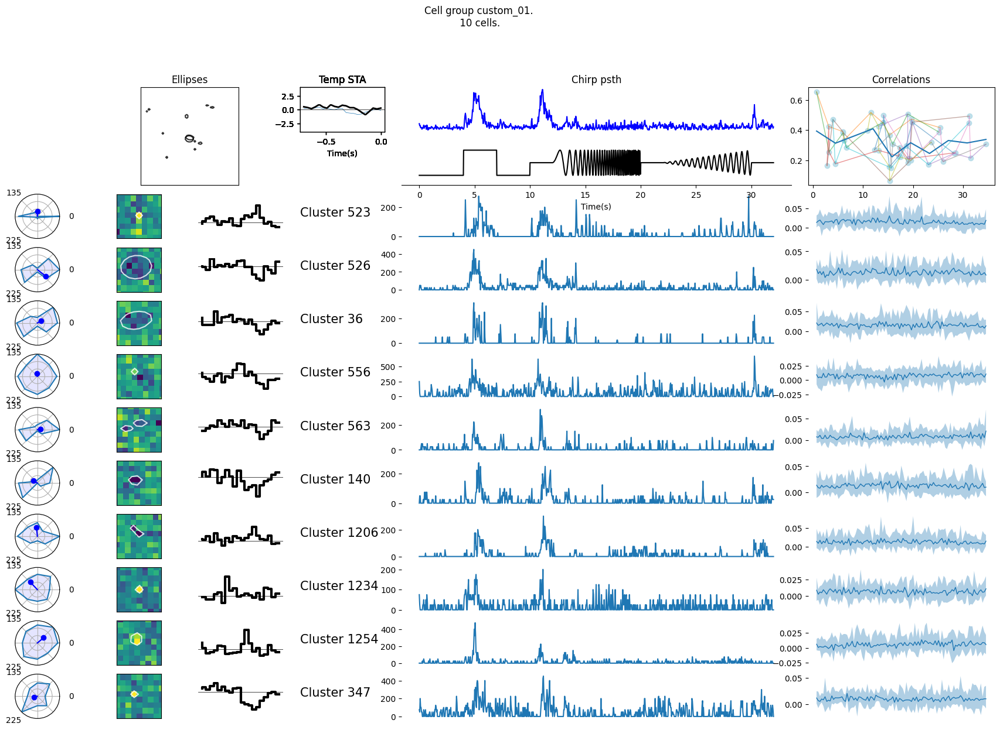

Number of cells in type ON low frequency: 29


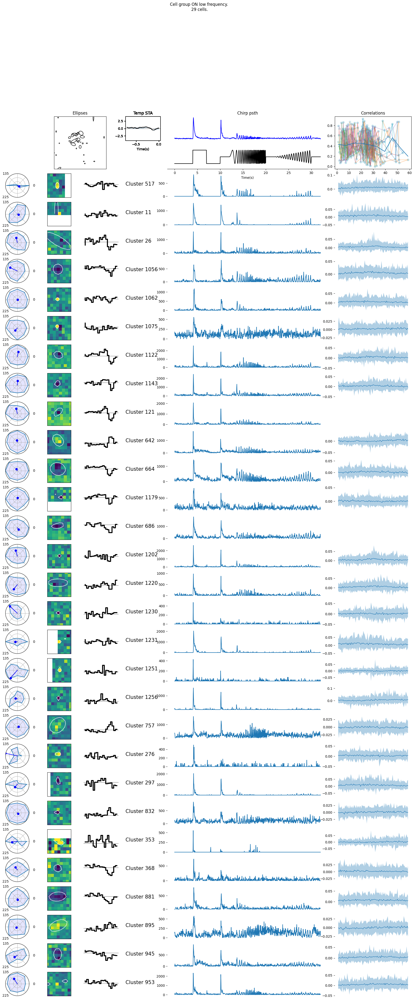

Number of cells in type ON-OFF JAM-B: 7


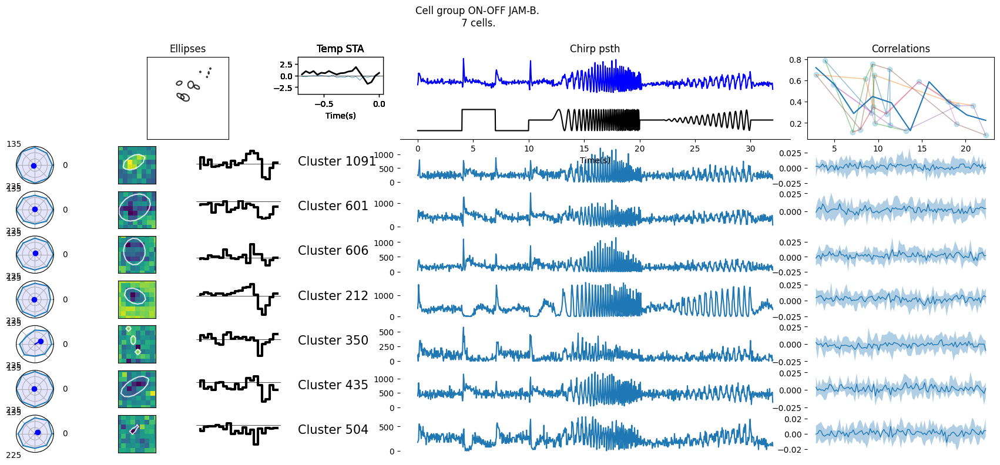

Number of cells in type custom_06: 3


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


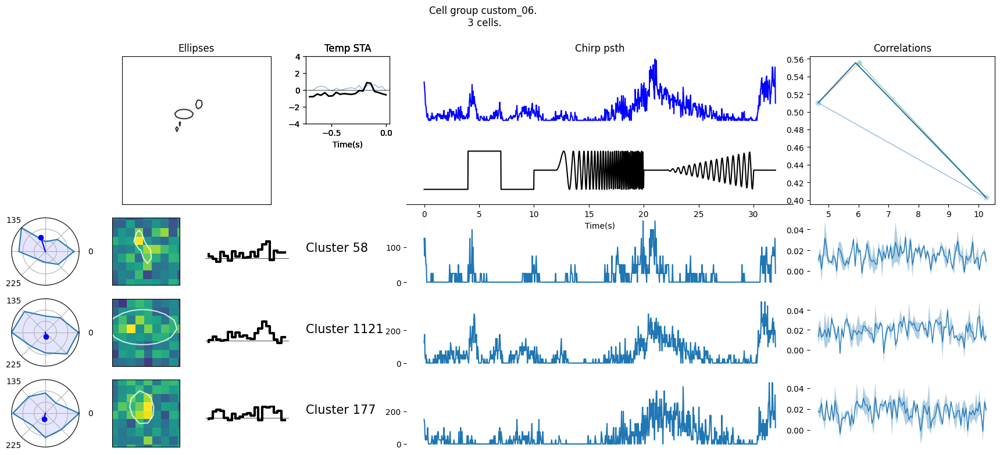

Number of cells in type ON mini alpha: 11


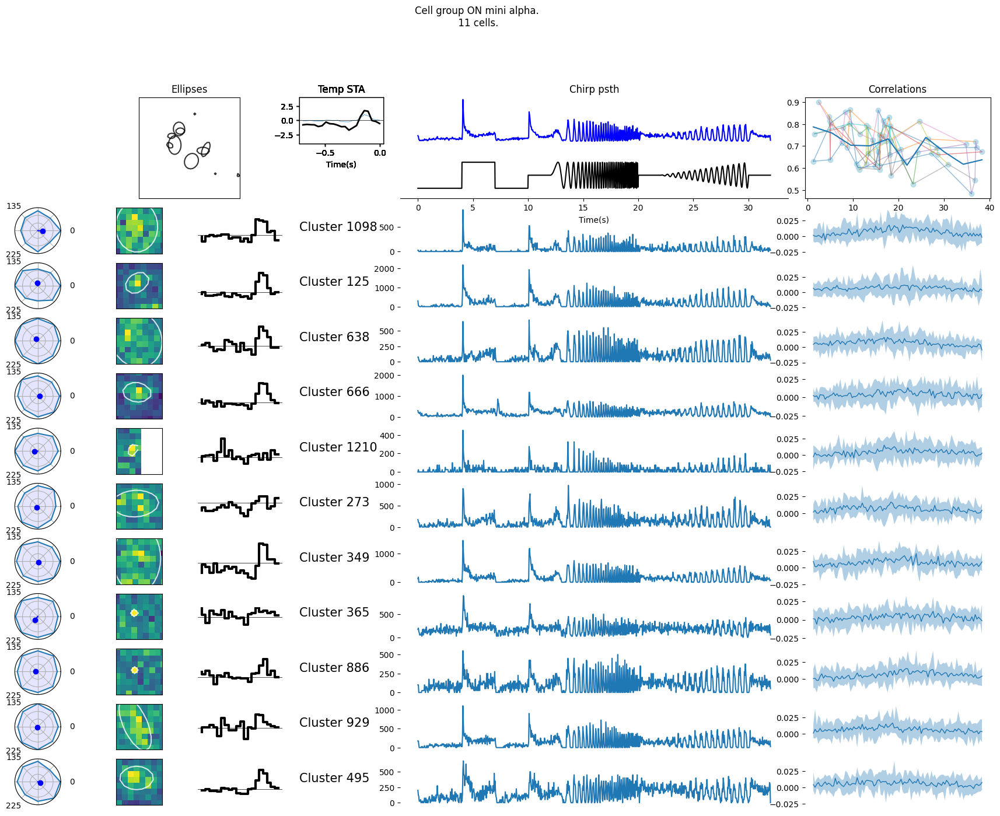

Number of cells in type custom_03: 4


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


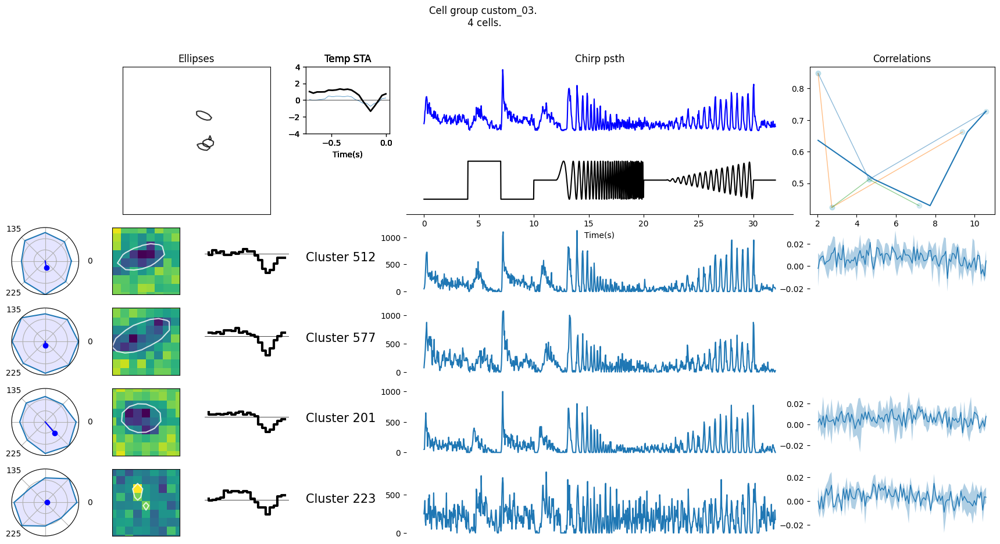

Number of cells in type ON local transient OS: 11


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


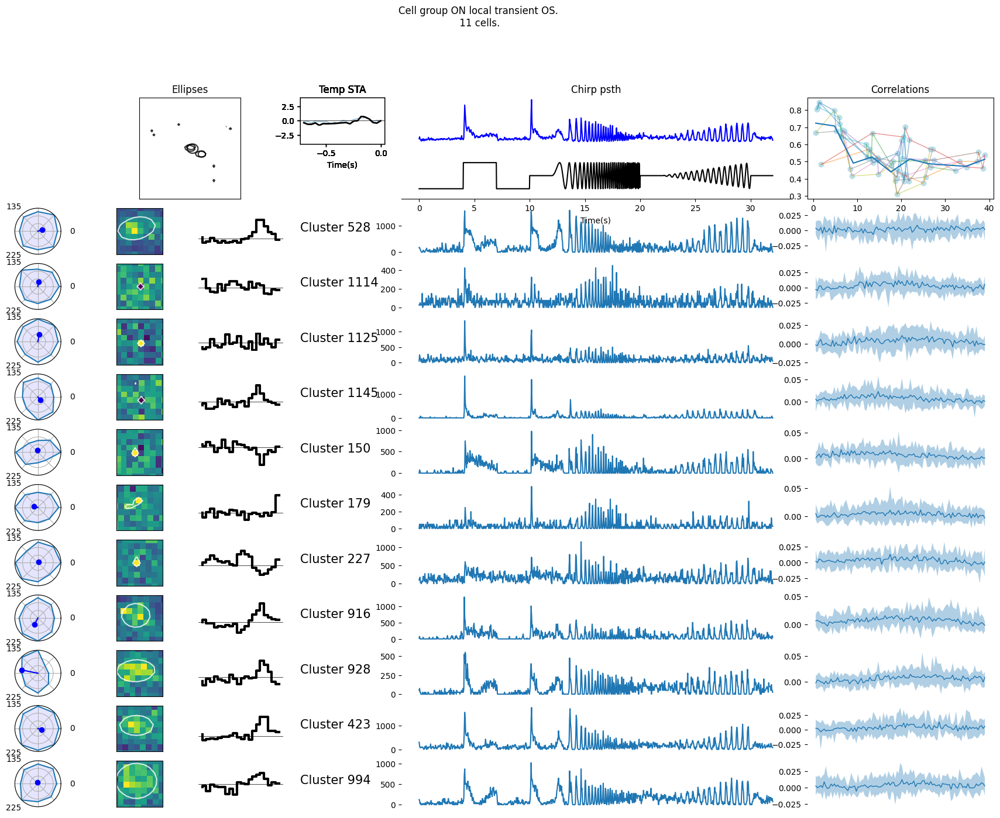

Number of cells in type custom_07: 6


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


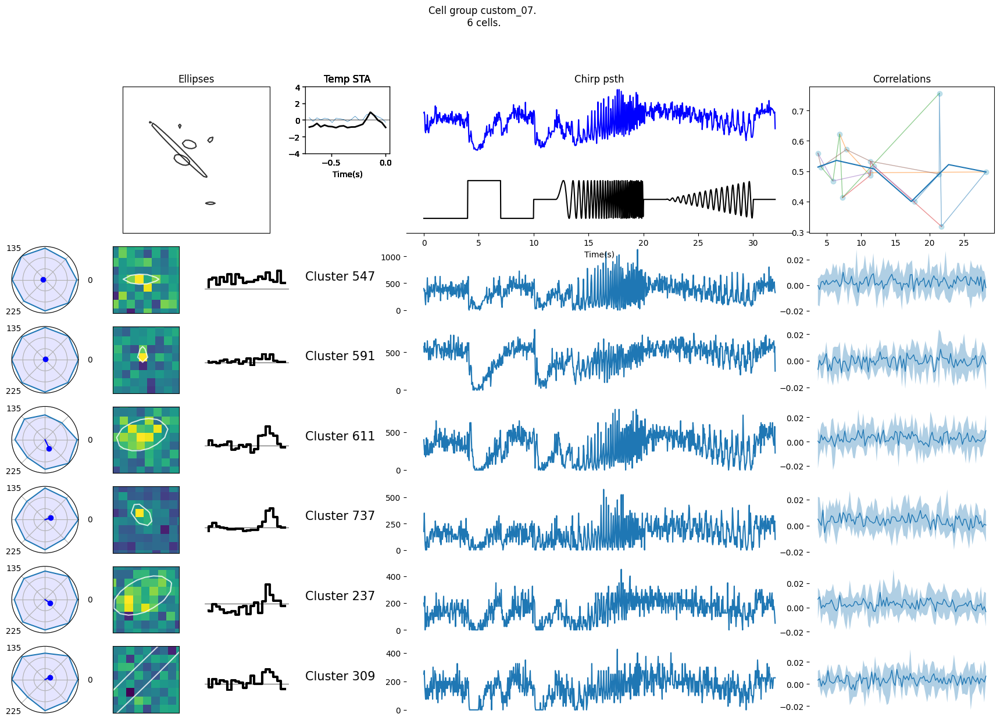

Number of cells in type ON-OFF local-edge W3: 12


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


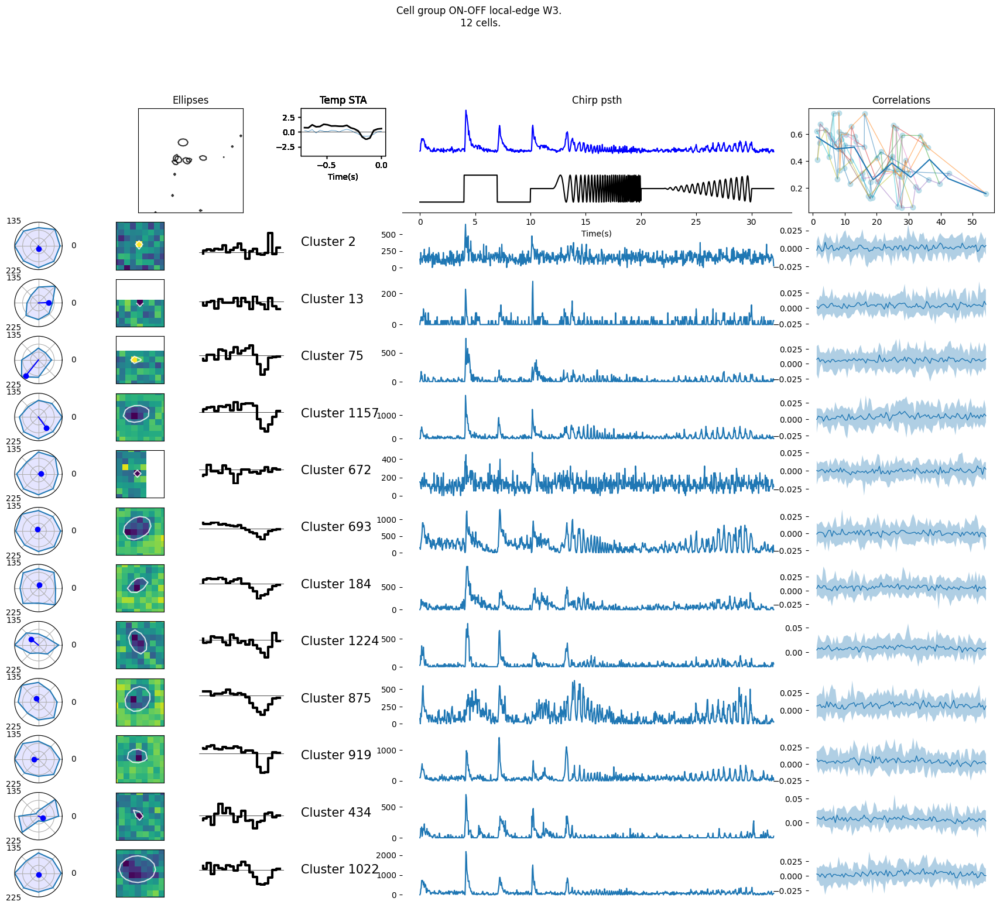

Number of cells in type custom_02: 10


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


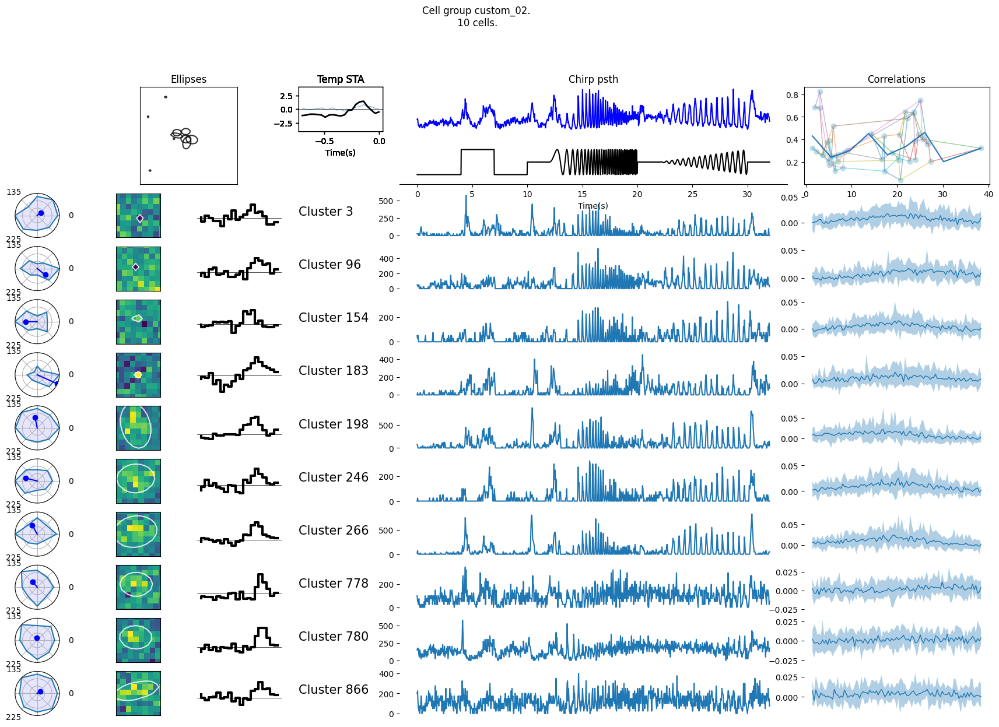

Number of cells in type ON transient: 4


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


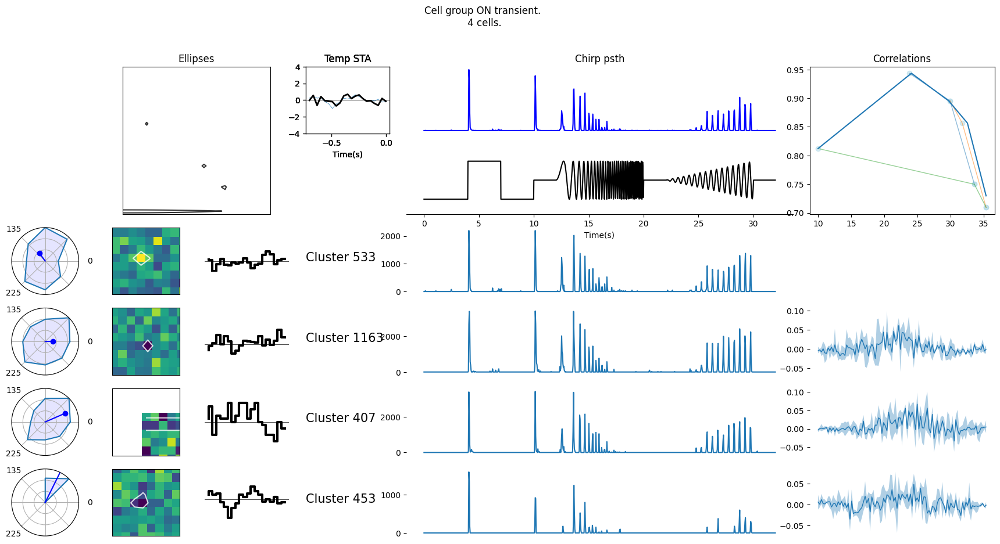

Number of cells in type ON constrast suppression: 6


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


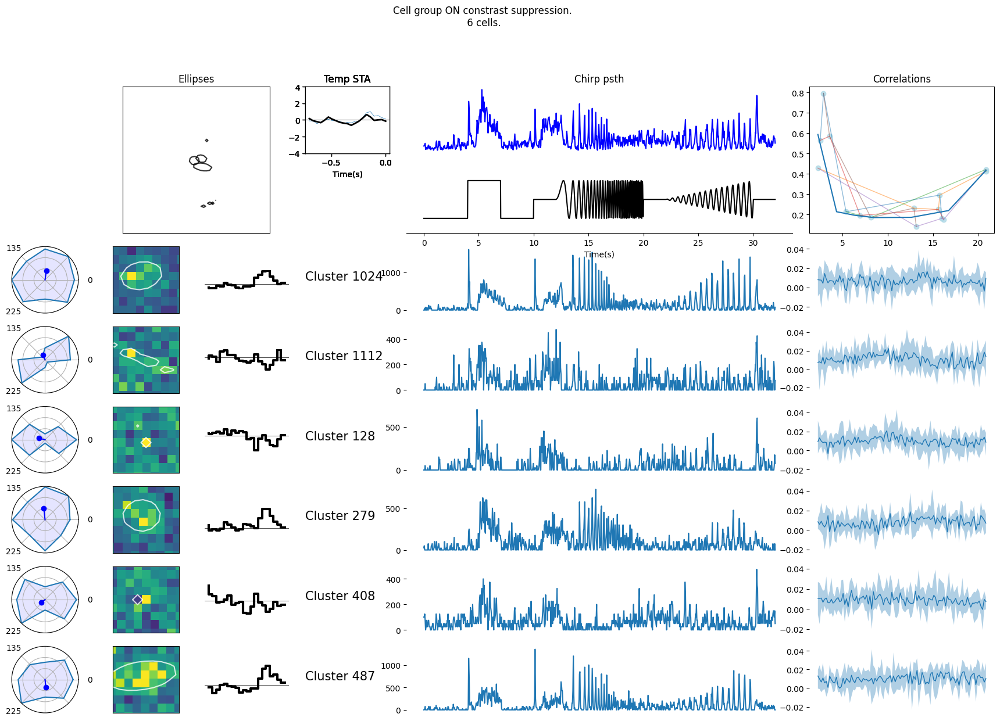

Number of cells in type ON step: 49


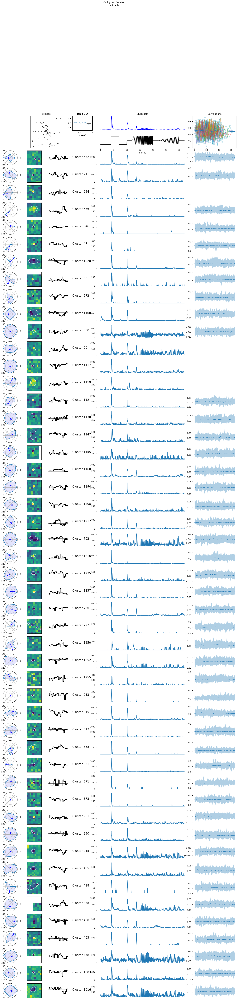

Number of cells in type custom_05: 4


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


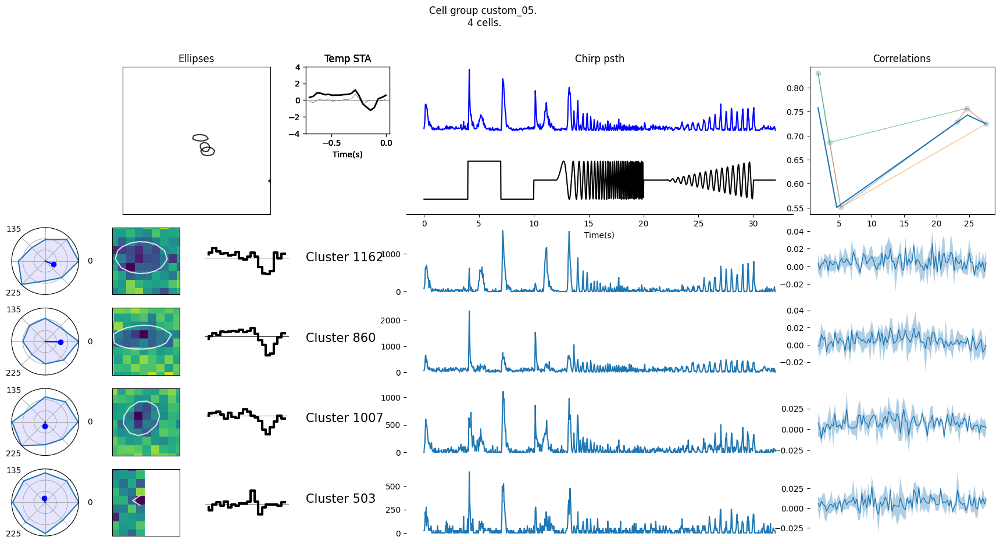

Number of cells in type OFF local OS: 8


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


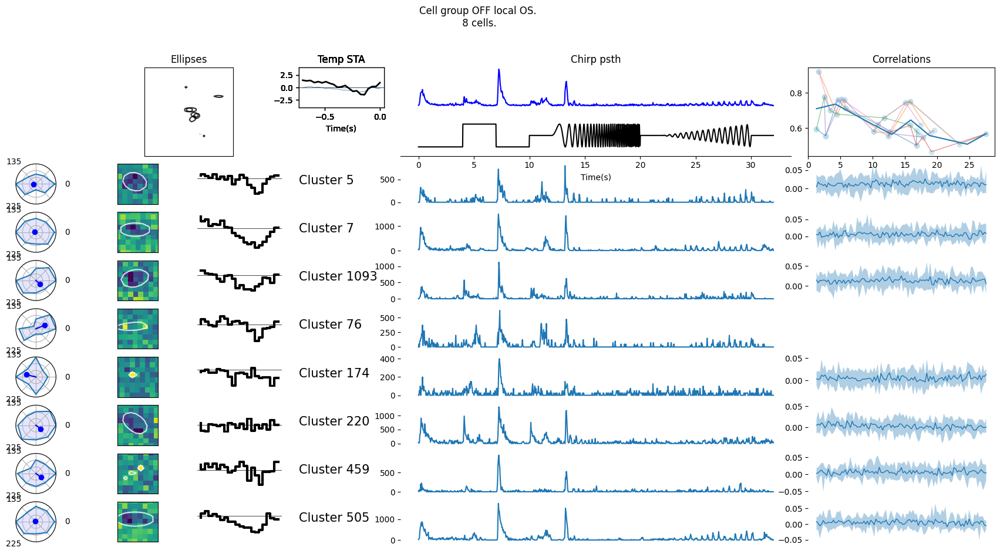

Number of cells in type custom_04: 9


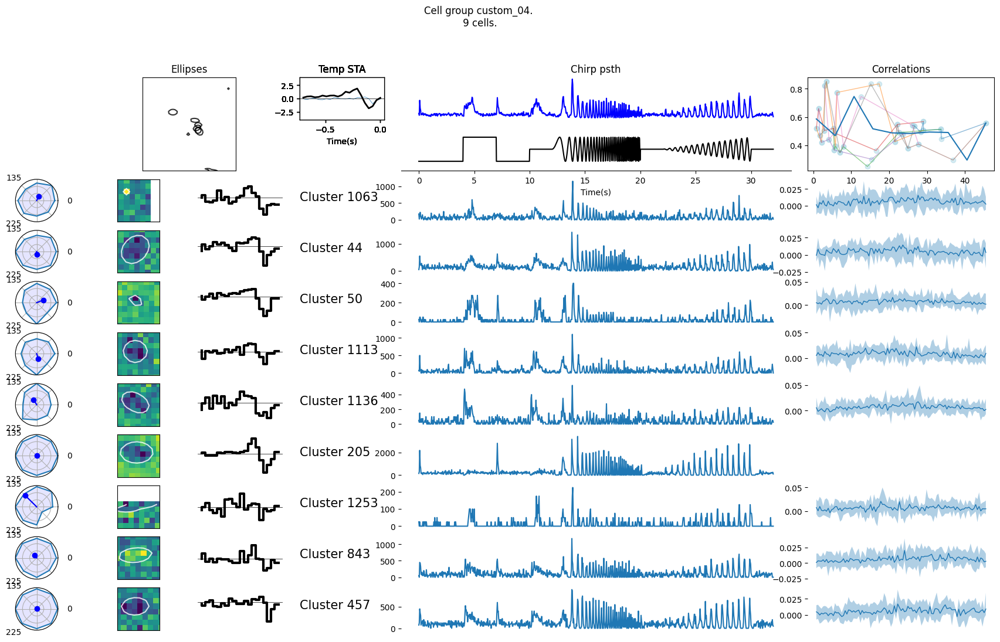

Number of cells in type ON DS sustained 2: 14


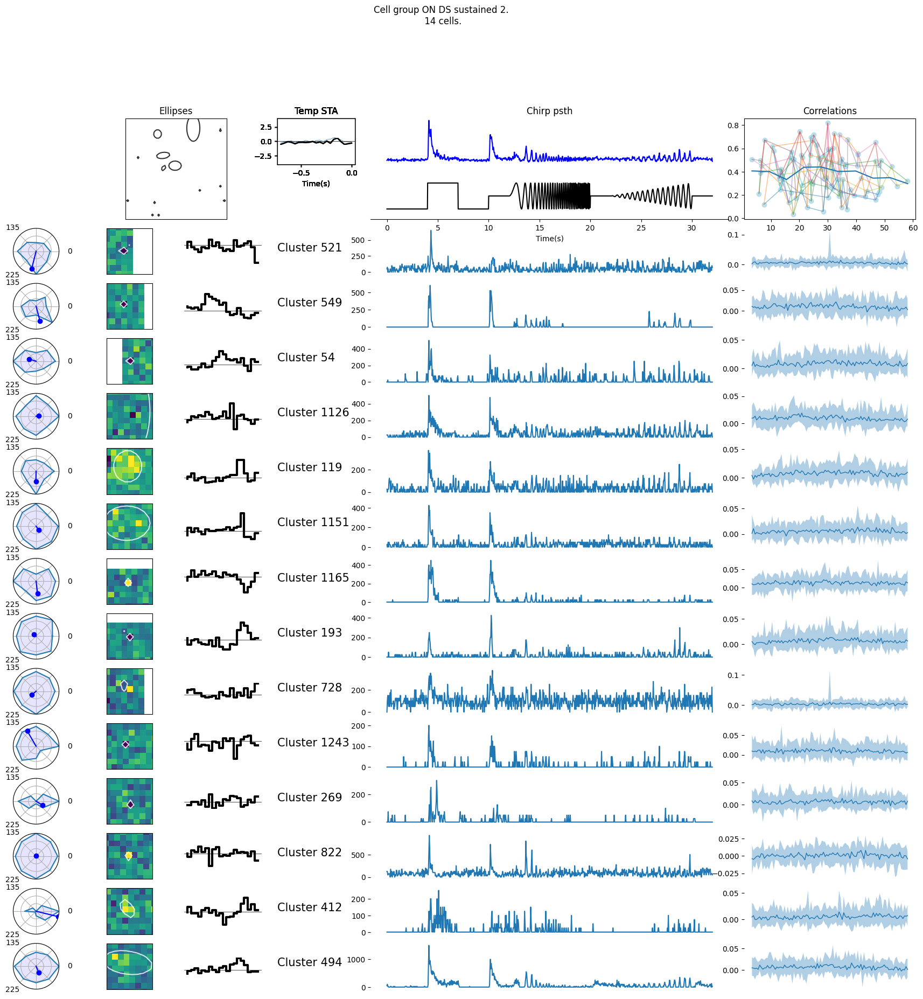

Number of cells in type ON-OFF DS 1: 3


/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/awen/anaconda3/envs/pipeline/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


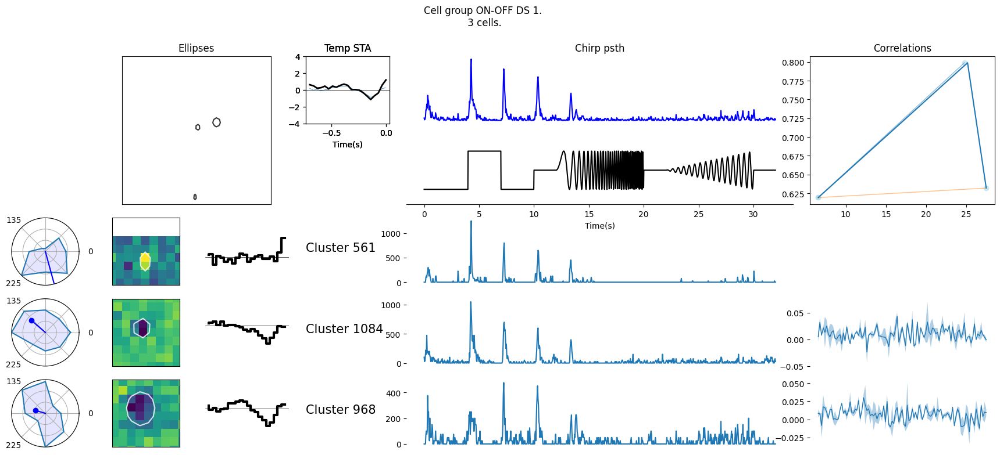

In [91]:
""" 
    Input
"""
#Name of the experiment


"""
    Plotting
"""

for name_cluster in tqdm(list(set([cell_data[cell]["baden_type"]['name'] for cell in cell_data.keys() if cell_data[cell]["baden_type"]['name'] != 'Not assigned'])), desc="Plotting..."):
    idx_cluster = list(np.where ( np.array(list(cell_data[cell]["baden_type"]['name'] for cell in selected_cells )) == name_cluster ) [0])
    print('Number of cells in type {}: {}'.format(name_cluster,len(idx_cluster)))

    gs = GridSpec(len(idx_cluster)+2, 10)
    
    if len(idx_cluster)<7:
        yspan = 2
    else:
        yspan=-2
    fig=plt.figure(figsize=(22,(len(idx_cluster)+yspan)*1.75))
    plt.suptitle("Cell group {}.\n {} cells.".format(name_cluster, len(idx_cluster)))

    #-------------------------------
    # Loop cells in cluster
    line = 2
    STAs=np.zeros(21)
    STAcount=0
    waves=np.zeros(101)
    wavecount=0
    ax0= fig.add_subplot(gs[0:2,1:3])
    ax_dist_corr= fig.add_subplot(gs[0:2,8:])
    
    # Set the color cycle for the axis
#     colors = ['blue', 'lightblue', 'skyblue', 'deepskyblue', 'dodgerblue', 'royalblue', 'steelblue', 'mediumslateblue', 'darkslateblue', 'midnightblue']
#     ax_dist_corr.set_prop_cycle('color', colors)
    cum_dist = []
    cum_corr = []
    for index in sorted(idx_cluster):
        cell_nb = selected_cells[index]
        
        #-----------------
        # Plot temp STA
        ax= fig.add_subplot(gs[line,2])
        
#         ax.set_ylim([-4,4])
        ax.axis("off")
        ax.set_aspect(0.175)
        temporal_sta=sta_results[cell_nb]['center_analyse']['Temporal'][-21:]
        ax.step(np.linspace(-21/30,0,21),temporal_sta,'k',lw=3)
#         ax.set_title('Cluster {}'.format(cell_nb))
        ax.axhline(0,color='k',lw=0.5)
        
        STAs+=temporal_sta
        STAcount+=1
        
        #-----------------
        # Plot temp STA avg
        ax= fig.add_subplot(gs[0,3])
        
        ax.set_title('Temp STA')
        ax.set_ylim([-4,4])
        ax.plot(np.linspace(-21/30,0,21),temporal_sta,lw=0.5)
        ax.axhline(0,color='k',lw=0.5)
        ax.set_xlabel('Time(s)')
        
         #-----------------
        # plot Chirp
        ax= fig.add_subplot(gs[line,4:8])
        
        #cell_index=selected_cells.index(cell_nb)
        ax.plot(np.linspace(0,32,800),cell_data[cell_nb]["psth"])
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xticks([])
        plt.locator_params(axis="y", nbins=3)
        
        if cell_data[cell_nb]["corrs"] != []:
            #-----------------
            # plot correlation over distance
            sorted_dists, sorted_max_corr = zip(*sorted(zip(cell_data[cell_nb]["baden_corr"]["distances"], cell_data[cell_nb]["baden_corr"]["max_corr"])))
            cum_dist+= list(sorted_dists)
            cum_corr+= list(sorted_max_corr)
            
            ax_dist_corr.scatter(sorted_dists, sorted_max_corr, marker='o', linewidths=1, color='lightblue', alpha=0.5)
            ax_dist_corr.plot(sorted_dists, sorted_max_corr, linestyle='-', linewidth=1, alpha=0.5)
            ax_dist_corr.set_title("Correlations")
            ax_dist_corr.set_zorder(20)
            ax_dist_corr.set_visible(True)
            #-----------------
            # plot correlations

            ax = fig.add_subplot(gs[line,8:])
            plt.plot(np.arange(-int(len(cell_data[cell_nb]["baden_corr"]["mean_corr"])/2),int(len(cell_data[cell_nb]["baden_corr"]["mean_corr"])/2)+1,1), cell_data[cell_nb]["baden_corr"]["mean_corr"], linewidth=1)
            plt.fill_between(np.arange(-int(len(cell_data[cell_nb]["baden_corr"]["mean_corr"])/2),int(len(cell_data[cell_nb]["baden_corr"]["mean_corr"])/2)+1,1), np.min(np.asarray(cell_data[cell_nb]["baden_corr"]["corrs"]),axis=0), np.max(np.asarray(cell_data[cell_nb]["baden_corr"]["corrs"]),axis=0), alpha=0.35)
            ax.set_xticks([])
#             ax.set_yticks([0,0.5,1])
            
            ax.spines['bottom'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
        else :
            ax_dist_corr.set_visible(False)
            sorted_dists = []
            sorted_max_corr = []
        
        #-----------------
        # plot Spatial STA
        ax= fig.add_subplot(gs[line,1])
        
        parameters=sta_results[cell_nb]['center_analyse']['EllipseCoor']
        x0=parameters[1]
        y0=parameters[2]
        
        ax = plot_sta(ax, sta_results[cell_nb]['center_analyse']['Spatial'],parameters)
        ax.set_xlim(x0-4,x0+4)
        ax.set_ylim(y0+4,y0-4)
        ax.set_aspect('equal')
        ax.set_xticks([])
        ax.set_yticks([])
        
        gaussian = gaussian2D(sta_results[cell_nb]['center_analyse']['Spatial'].shape,*parameters)
        if parameters[0] != 0:
            ax0.contour(np.abs(gaussian),levels = [0.6*np.max(np.abs(gaussian))], colors='k',linestyles = 'solid', alpha = 0.8)

        ax= fig.add_subplot(gs[line,3])
        ax.annotate('Cluster {}'.format(cell_nb), (0,0.5), (0, 0.5), fontsize=15)

        ax.axis('off')
        
        #----------------
        # plot orientation selectivity
        ax = fig.add_subplot(gs[line, 0],polar=True)
        
        theta = np.linspace(0, 2 * np.pi, 9)
        # Arrange the grid into number of sales equal parts in degrees
        lines, labels = plt.thetagrids(range(0, 360, int(360/8)),np.arange(0,360,45))
        # Plot actual sales graph
        ax.plot(theta, DG_set[cell_nb]['Tuning'])
        ax.fill(theta, DG_set[cell_nb]['Tuning'], 'b', alpha=0.1)
        ax.plot([DG_set[cell_nb]['atune'],DG_set[cell_nb]['atune']],[0,DG_set[cell_nb]['Rtune']],'b-')
        ax.plot([DG_set[cell_nb]['atune']],[DG_set[cell_nb]['Rtune']],'bo')
        ax.set_yticks([0,0.333,0.666, 1])
        ax.set_yticklabels([])
        ax.set_xticklabels([0,'','', 135,'',225,'',''])
        ax.set_ylim([0,1])
    
        
        line+=1
    #-----------------
    # avg STA
    STAs=STAs/STAcount
    ax= fig.add_subplot(gs[0,3])
    ax.plot(np.linspace(-21/30,0,21),STAs,'k',lw=2)
#     ax.set_ylim([-4,4])
    ax.set_aspect(0.175)
    ax.axis("off")

    #-----------------
    #size ellipses
    
    ax0.set_title('Ellipses')
#     ax0.set_xlim(4,20)
#     ax0.set_ylim(20,4)
    ax0.set_aspect('equal')
    ax0.set_xticks([])
    ax0.set_yticks([])
        
    #-----------------
    # mean chirp psth
    ax= fig.add_subplot(gs[0,4:8])
    ax.set_title('Chirp psth')
    
    ax.plot(np.linspace(0,32,800),np.mean(psth_z[idx_cluster,:], 0),'b')
    ax.axis("off")

    #-----------------
    # plot chirp stim
    ax= fig.add_subplot(gs[1,4:8])
    
    ax.plot(np.linspace(0,32,1600),euler_vec[0+151:151+1600,1]*1., color='k')
    ax.set_yticks([])
    ax.set_ylim([-100,350])
    ax.set_xlabel('Time(s)')
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(True)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    
    #-----------------
    # plot mean correlation over distance
    
    if cell_data[cell_nb]["baden_corr"]["corrs"] != []:
        sorted_dists, sorted_max_corr = zip(*sorted(zip(cum_dist,cum_corr)))
    #     n_bin = int(len(sorted_dists)/1)
    #     print(n_bin)
        n_bin=10

        xlim = np.linspace(min(sorted_dists), max(sorted_dists),n_bin+1)
        mean = [np.mean(np.asarray(sorted_max_corr)[np.where(np.logical_and(sorted_dists>=xlim[i] , sorted_dists<=xlim[i+1]))[0]]) for i in range(len(xlim)-1)]
        lmin = [min(np.asarray(sorted_max_corr)[np.where(np.logical_and(sorted_dists>=xlim[i] , sorted_dists<=xlim[i+1]))[0]], default=np.nan) for i in range(len(xlim)-1)]
        lmax = [max(np.asarray(sorted_max_corr)[np.where(np.logical_and(sorted_dists>=xlim[i] , sorted_dists<=xlim[i+1]))[0]], default=np.nan) for i in range(len(xlim)-1)]

        x_pos = np.linspace(min(sorted_dists), max(sorted_dists),n_bin)
        ax_dist_corr.plot(x_pos[np.isfinite(mean)],np.asarray(mean)[np.isfinite(mean)], color='#1f77b4')
#         ax_dist_corr.fill_between(x_pos[np.isfinite(lmin) & np.isfinite(lmax)],np.asarray(lmin)[np.isfinite(lmin) & np.isfinite(lmax)],np.asarray(lmax)[np.isfinite(lmin) & np.isfinite(lmax)], alpha=0.2)
    #plt.show()

    fsave = os.path.join(fig_directory, 'Type_{}'.format(name_cluster))
    fig.savefig(fsave+'.png',format='png',dpi=250)
    plt.close(fig)


    